# YOLOv8/v9 Patch-Based-Inference Example:

```bash
pip install patched_yolo_infer
```

In [1]:
import cv2
from ultralytics import YOLO

from patched_yolo_infer import (
    MakeCropsDetectThem,
    CombineDetections,
    visualize_results_usual_yolo_inference,
    visualize_results,
)

ModuleNotFoundError: No module named 'patched_yolo_infer'

---

__To carry out patch-based inference of YOLO models using our library, you need to follow a sequential procedure. First, you create an instance of the MakeCropsDetectThem class, providing all desired parameters related to YOLO inference and the patch segmentation principle.<br/> Subsequently, you pass the obtained object of this class to CombineDetections, which facilitates the consolidation of all predictions from each overlapping crop, followed by intelligent suppression of duplicates. <br/>Upon completion, you receive the result, from which you can extract the desired outcome of frame processing.__

The output obtained from the process includes several attributes that can be leveraged for further analysis or visualization:

1. img: This attribute contains the original image on which the inference was performed. It provides context for the detected objects.

2. confidences: This attribute holds the confidence scores associated with each detected object. These scores indicate the model's confidence level in the accuracy of its predictions.

3. boxes: These bounding boxes are represented as a list of tuples, where each tuple contains four values: (x_min, y_min, x_max, y_max). These values correspond to the coordinates of the top-left and bottom-right corners of each bounding box.

4. masks: If available, this attribute provides segmentation masks corresponding to the detected objects. These masks can be used to precisely delineate object boundaries.

5. classes_ids: This attribute contains the class IDs assigned to each detected object. These IDs correspond to specific object classes defined during the model training phase.

6. classes_names: These are the human-readable names corresponding to the class IDs. They provide semantic labels for the detected objects, making the results easier to interpret.

```
MakeCropsDetectThem - Class implementing cropping and passing crops through a neural network
for detection/segmentation.
Args:
    image (np.ndarray): Input image BGR.
    model_path (str): Path to the YOLO model.
    imgsz (int): Size of the input image for inference YOLO.
    conf (float): Confidence threshold for detections YOLO.
    iou (float): IoU threshold for non-maximum suppression YOLOv8 of single crop.
    classes_list (List[int] or None): List of classes to filter detections. If None, 
                                        all classes are considered. Defaults to None.
    segment (bool): Whether to perform segmentation (YOLOv8-seg).
    shape_x (int): Size of the crop in the x-coordinate.
    shape_y (int): Size of the crop in the y-coordinate.
    overlap_x (int): Percentage of overlap along the x-axis.
    overlap_y (int): Percentage of overlap along the y-axis.
    show_crops (bool): Whether to visualize the cropping.
    resize_initial_size (bool): Whether to resize the results to the original 
                                image size (ps: slow operation).

CombineDetections - Class implementing combining masks/boxes from multiple crops + NMS (Non-Maximum Suppression).
Args:
    element_crops (MakeCropsDetectThem): Object containing crop information.
    nms_threshold (float): IoU/IoS threshold for non-maximum suppression.
    match_metric (str): Matching metric, either 'IOU' or 'IOS'.
```

In [7]:
# Load the image 
img_path = 'test_images/image-test.jpg'
img = cv2.imread(img_path)

## Detection:

In [8]:
element_crops = MakeCropsDetectThem(
    image=img,
    model_path="yolov8m.pt",
    segment=False,
    show_crops=False,
    shape_x=600,
    shape_y=600,
    overlap_x=50,
    overlap_y=50,
    conf=0.5,
    iou=0.7,
    classes_list=[0, 1, 2, 3, 5, 7],
    resize_initial_size=True,
)
result = CombineDetections(element_crops, nms_threshold=0.05, match_metric='IOS')

Visualization:

Basic yolo inference:


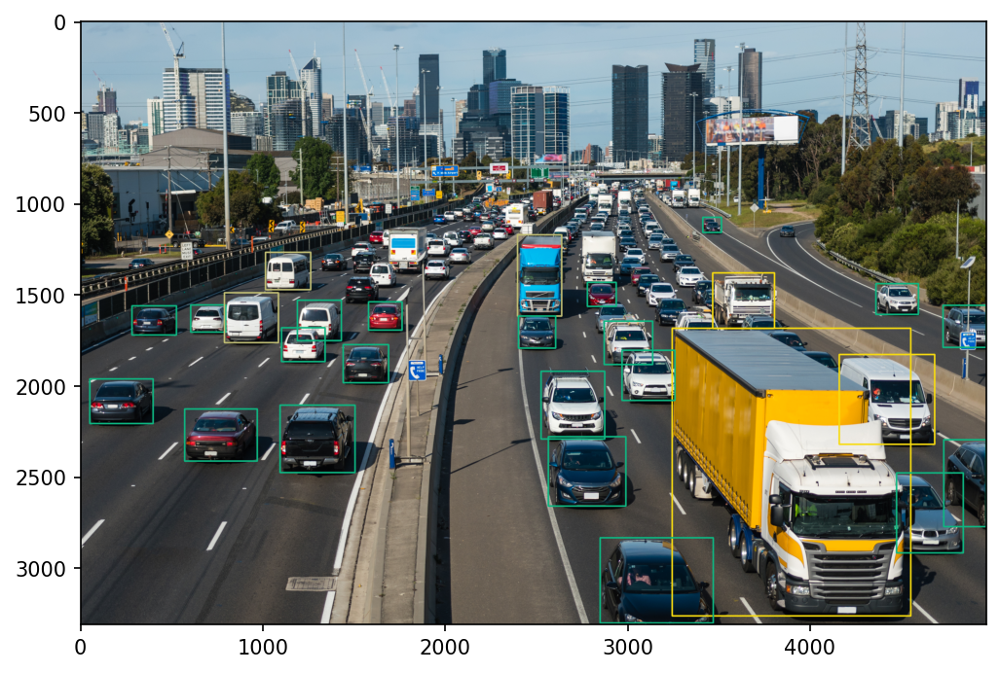

YOLO-Patch-Based-Inference:


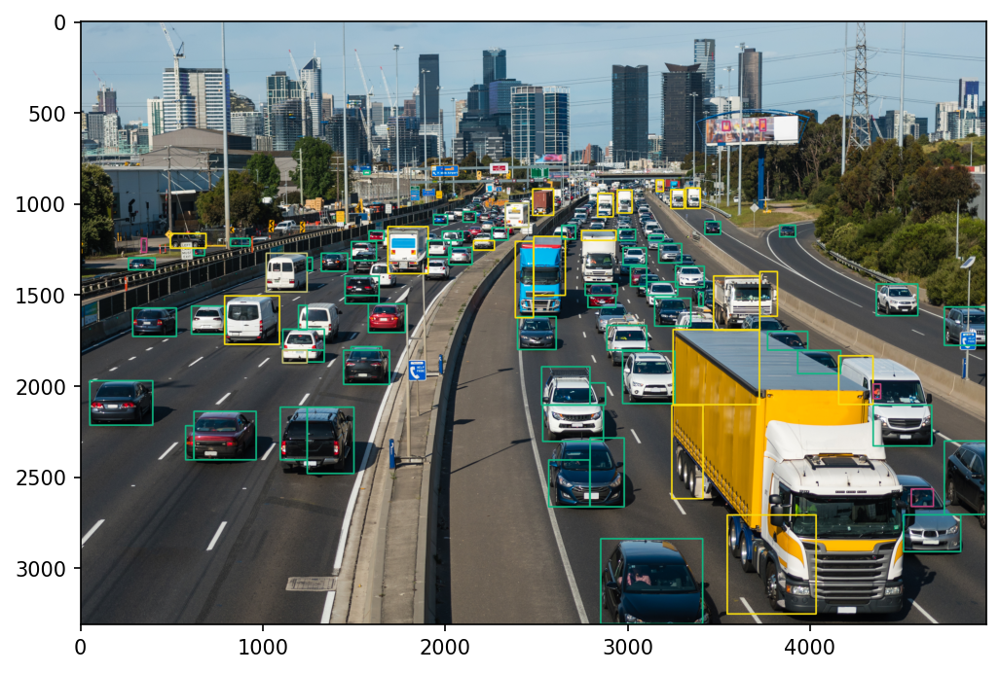

In [9]:
print('Basic yolo inference:')
visualize_results_usual_yolo_inference(
    img,
    model=YOLO("yolov8m.pt") ,
    imgsz=640,
    conf=0.5,
    iou=0.7,
    thickness=8,
    font_scale=1.1,
    show_boxes=True,
    delta_colors=3,
    show_class=False,
    axis_off=False
)

print('YOLO-Patch-Based-Inference:')
visualize_results(
    img=result.image,
    confidences=result.filtered_confidences,
    boxes=result.filtered_boxes,
    masks=result.filtered_masks,
    classes_ids=result.filtered_classes_id,
    classes_names=result.filtered_classes_names,
    thickness=8,
    font_scale=1.1,
    show_boxes=True,
    delta_colors=3,
    show_class=False,
    axis_off=False
)

PS: You can learn more about how to work with functions for visualizing detection and segmentation results in the examples/example_extra_functions.ipynb notebook.

#### Test of our nms method:

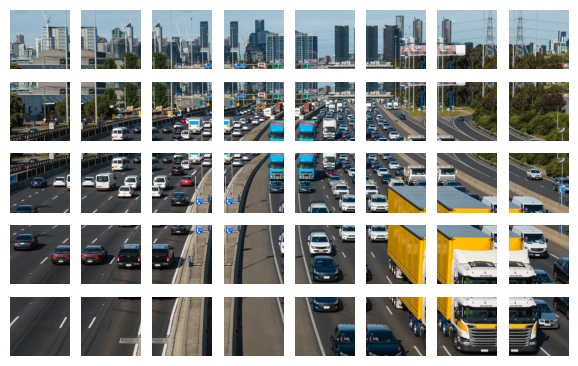

Number of generated images: 40
Before nms:


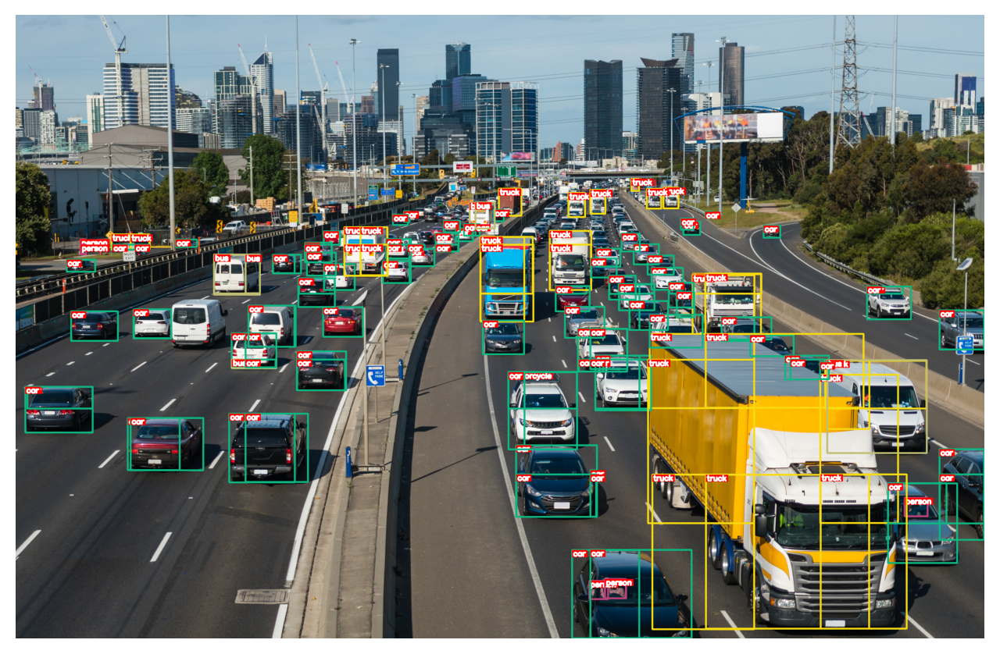

After nms:


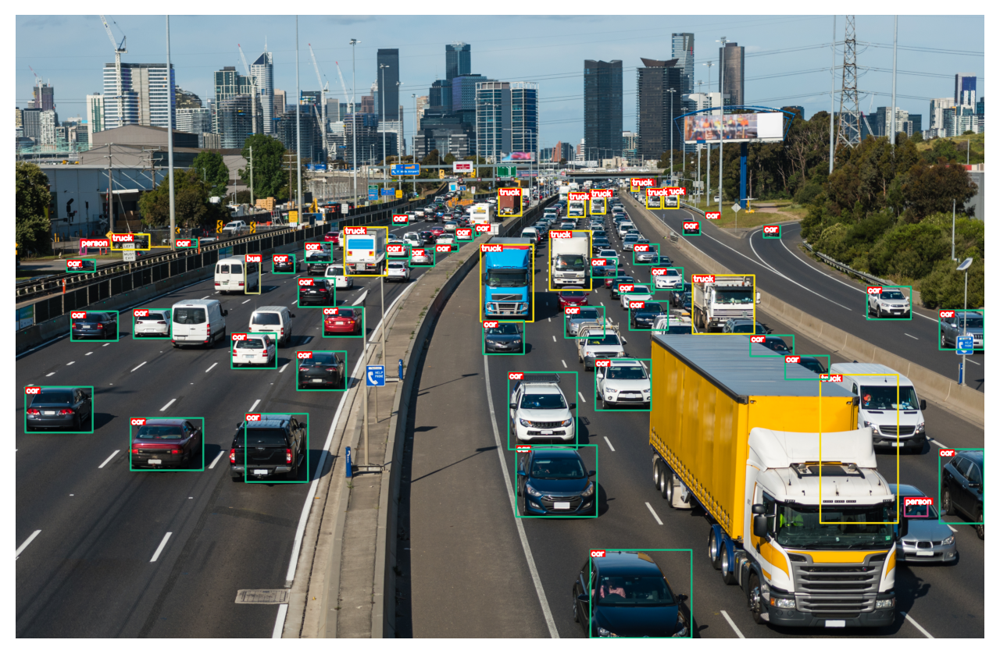

In [14]:
element_crops = MakeCropsDetectThem(
    image=img,
    model_path="yolov8m.pt",
    segment=False,
    show_crops=True,
    shape_x=800,
    shape_y=800,
    overlap_x=30,
    overlap_y=30,
    conf=0.5,
    iou=0.7,
    classes_list=[0, 1, 2, 3, 5, 7],
    resize_initial_size=False,
)
result = CombineDetections(element_crops, nms_threshold=0.05, match_metric='IOS')

print('Before nms:')
visualize_results(
    img=result.image,
    confidences=result.detected_conf_list_full,
    boxes=result.detected_xyxy_list_full,
    masks=result.detected_masks_list_full,
    classes_ids=result.detected_cls_id_list_full,
    classes_names=result.detected_cls_names_list_full,
    thickness=8,
    font_scale=1.2,
    show_boxes=True,
    delta_colors=3,
    dpi=200,
)

print('After nms:')
visualize_results(
    img=result.image,
    confidences=result.filtered_confidences,
    boxes=result.filtered_boxes,
    masks=result.filtered_masks,
    classes_ids=result.filtered_classes_id,
    classes_names=result.filtered_classes_names,
    thickness=8,
    font_scale=1.2,
    show_boxes=True,
    delta_colors=3,
    dpi=200,
)

---

## Instance Segmentation:

In [15]:
element_crops = MakeCropsDetectThem(
    image=img,
    model_path="yolov8m-seg.pt",
    segment=True,
    show_crops=False,
    shape_x=600,
    shape_y=600,
    overlap_x=50,
    overlap_y=50,
    conf=0.5,
    iou=0.7,
    classes_list=[0, 1, 2, 3, 5, 7],
    resize_initial_size=True,
)
result = CombineDetections(element_crops, nms_threshold=0.5, match_metric='IOS')

KeyboardInterrupt: 

Visualization:

Basic yolo inference:


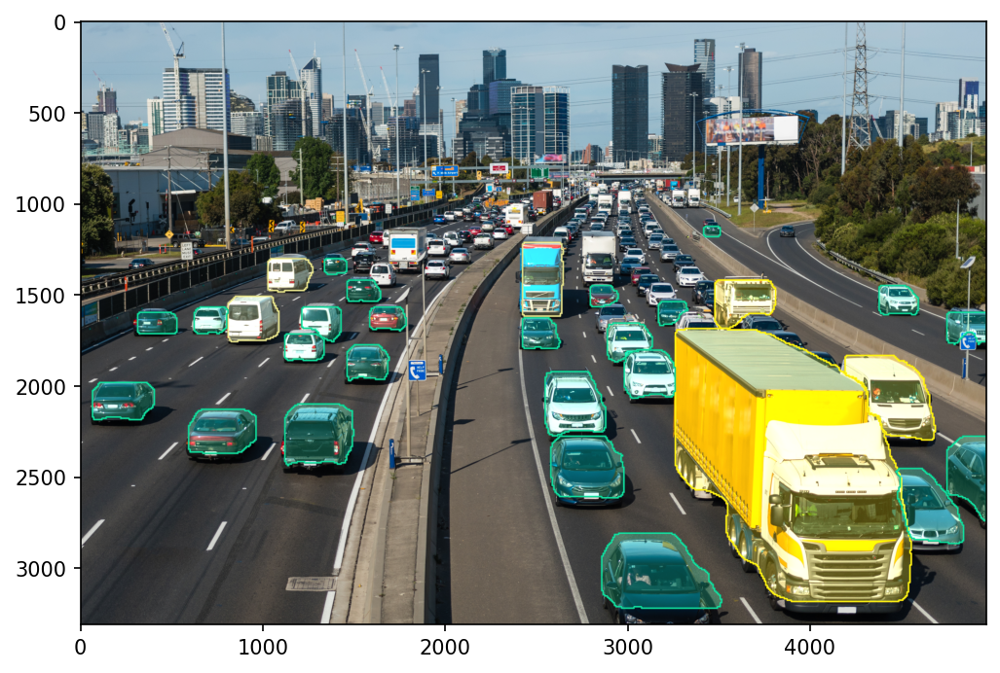

YOLO-Patch-Based-Inference:


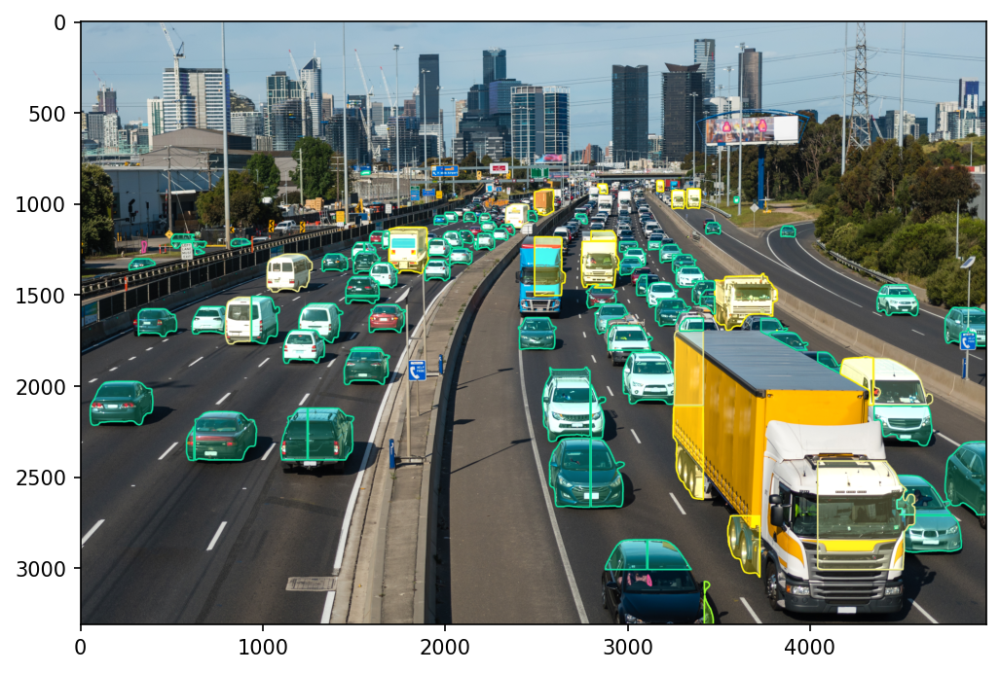

In [ ]:
print('Basic yolo inference:')
visualize_results_usual_yolo_inference(
    img,
    model=YOLO("yolov8m-seg.pt") ,
    imgsz=640,
    conf=0.5,
    iou=0.7,
    segment=True,
    thickness=8,
    font_scale=1.1,
    fill_mask=True,
    show_boxes=False,
    delta_colors=3,
    show_class=False,
    axis_off=False
)

print('YOLO-Patch-Based-Inference:')
visualize_results(
    img=result.image,
    confidences=result.filtered_confidences,
    boxes=result.filtered_boxes,
    masks=result.filtered_masks,
    classes_ids=result.filtered_classes_id,
    classes_names=result.filtered_classes_names,
    segment=True,
    thickness=8,
    font_scale=1.1,
    fill_mask=True,
    show_boxes=False,
    delta_colors=3,
    show_class=False,
    axis_off=False
)

#### Test of our nms method:

Before nms:


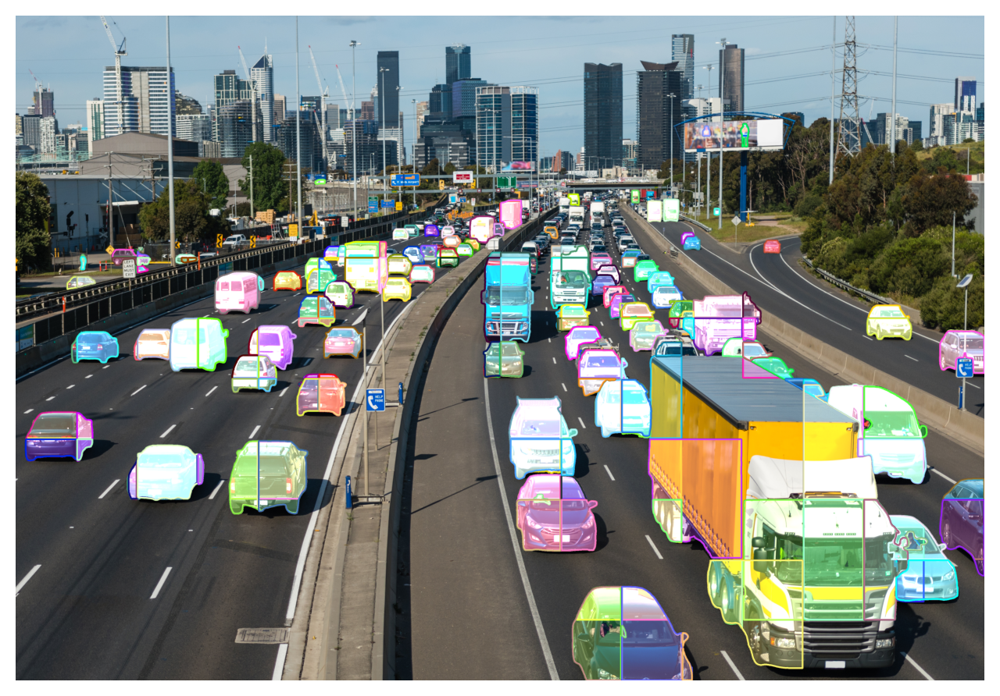

After nms:


KeyboardInterrupt: 

In [ ]:
element_crops = MakeCropsDetectThem(
    image=img,
    model_path="yolov8m-seg.pt",
    segment=True,
    show_crops=False,
    shape_x=600,
    shape_y=600,
    overlap_x=50,
    overlap_y=50,
    conf=0.5,
    iou=0.7,
    classes_list=[0, 1, 2, 3, 5, 7],
    resize_initial_size=False,
)
result = CombineDetections(element_crops, nms_threshold=0.5, match_metric='IOS')

print('Before nms:')
visualize_results(
    img=result.image,
    confidences=result.detected_conf_list_full,
    boxes=result.detected_xyxy_list_full,
    masks=result.detected_masks_list_full,
    classes_ids=result.detected_cls_id_list_full,
    classes_names=result.detected_cls_names_list_full,
    segment=True,
    thickness=8,
    font_scale=1.2,
    fill_mask=True,
    show_boxes=False,
    show_class=False,
    delta_colors=3,
    random_object_colors=True,
    dpi=200,
)

print('After nms:')
visualize_results(
    img=result.image,
    confidences=result.filtered_confidences,
    boxes=result.filtered_boxes,
    masks=result.filtered_masks,
    classes_ids=result.filtered_classes_id,
    classes_names=result.filtered_classes_names,
    segment=True,
    thickness=8,
    font_scale=1.2,
    fill_mask=True,
    show_boxes=False,
    show_class=False,
    delta_colors=3,
    random_object_colors=True,
    dpi=200,
)

---

Info for better understanding how algoritm works:

#### Example of how one crop is processed:

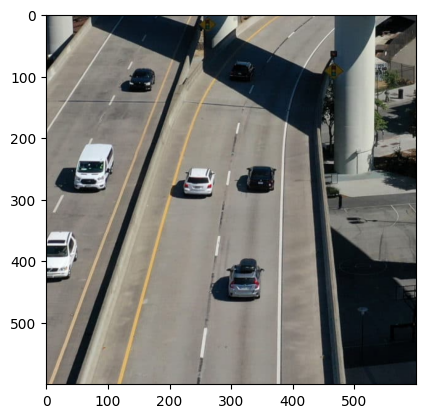

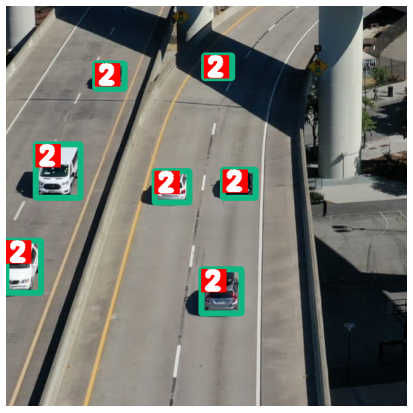

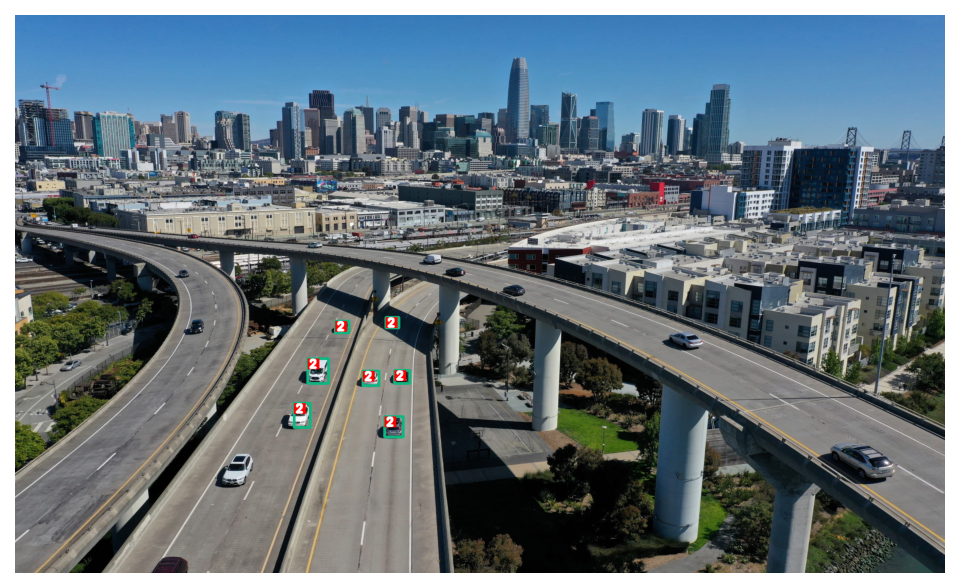

In [ ]:
import matplotlib.pyplot as plt
i = 30 # crop(patch) number
plt.imshow(cv2.cvtColor(element_crops.crops[i].crop.copy(), cv2.COLOR_BGR2RGB))
plt.show()


visualize_results(
    img=element_crops.crops[i].crop,
    confidences=element_crops.crops[i].detected_conf,
    boxes=element_crops.crops[i].detected_xyxy,
    classes_ids=element_crops.crops[i].detected_cls,
    segment=False,
    thickness=8,
    font_scale=1.2,
    fill_mask=True,
    show_boxes=True,
    delta_colors=3,
    dpi=65,
)

visualize_results(
    img=element_crops.crops[i].source_image_resized,
    confidences=element_crops.crops[i].detected_conf,
    boxes=element_crops.crops[i].detected_xyxy_real,
    classes_ids=element_crops.crops[i].detected_cls,
    segment=False,
    thickness=8,
    font_scale=1.2,
    fill_mask=True,
    show_boxes=True,
    delta_colors=3,
    dpi=150,
)

---

## YOLOv9 Example:

Basic yolo inference:


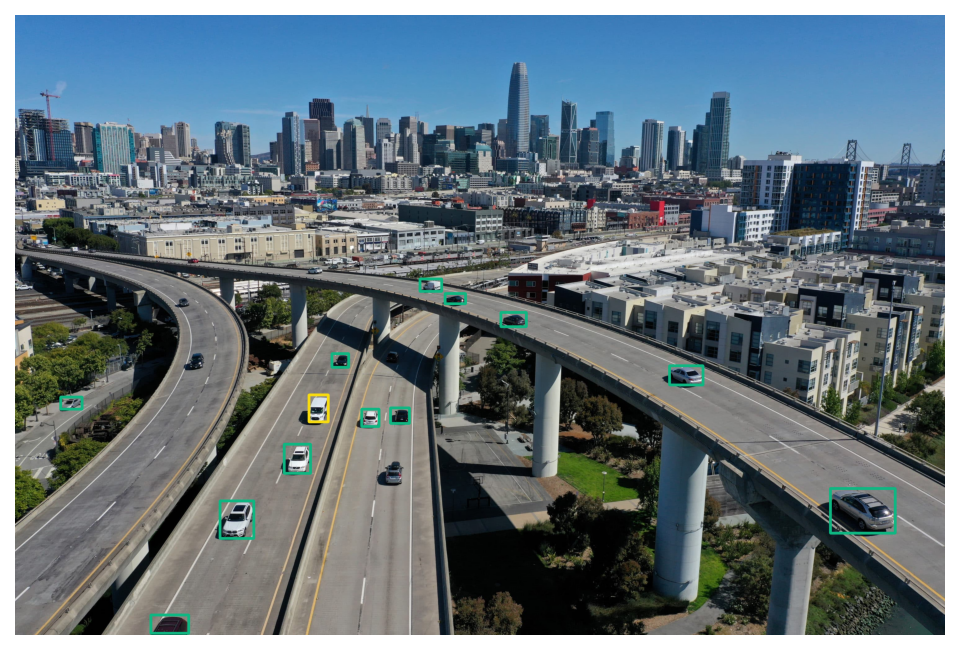

YOLO-Patch-Based-Inference:


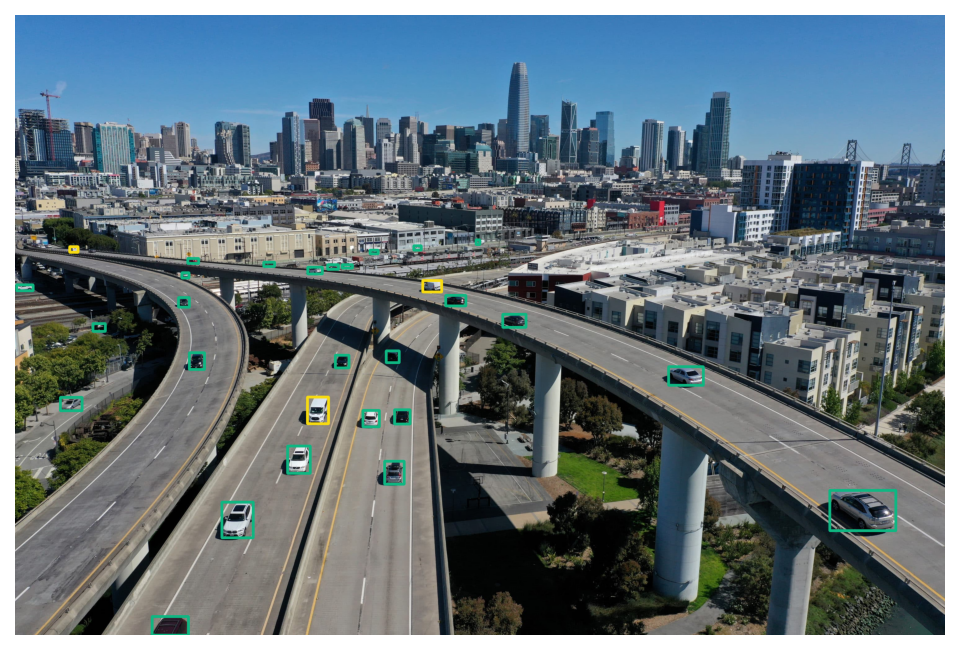

In [ ]:
element_crops = MakeCropsDetectThem(
    image=img,
    model_path="yolov9c.pt",
    segment=False,
    show_crops=False,
    shape_x=600,
    shape_y=500,
    overlap_x=50,
    overlap_y=50,
    conf=0.5,
    iou=0.7,
    classes_list=[0, 1, 2, 3, 5, 7],
    resize_initial_size=True,
)
result = CombineDetections(element_crops, nms_threshold=0.05, match_metric='IOS')

print('Basic yolo inference:')
visualize_results_usual_yolo_inference(
    img,
    model=YOLO("yolov9c.pt") ,
    imgsz=640,
    conf=0.5,
    iou=0.7,
    segment=False,
    thickness=8,
    font_scale=1.1,
    show_boxes=True,
    delta_colors=3,
    show_class=False,
)

print('YOLO-Patch-Based-Inference:')
visualize_results(
    img=result.image,
    confidences=result.filtered_confidences,
    boxes=result.filtered_boxes,
    masks=result.filtered_masks,
    classes_ids=result.filtered_classes_id,
    classes_names=result.filtered_classes_names,
    segment=False,
    thickness=8,
    show_boxes=True,
    delta_colors=3,
    show_class=False,
)